<a href="https://colab.research.google.com/github/mpky/abrams_project/blob/master/TF20_abrams_project_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### M1 Abrams Image Classification

In this notebook, I will do the following:
  - Display a few sample images
  - Set up ImageDataGenerator to flow my image data into my model
  - Build the Convolutional Neural Network
  - Train the model over 200 epochs
  - Evaluate broader model performance
  - Observe how my model performs on four specific test images from combatant social media accounts. I.e. determine if my model can actually achieve what I have set out to achieve.

### Set up Tensorboard and GDrive

In [1]:
# The file I/O with Google Colab is a bit tricky, especially when interacting with Google Drive
# Need to mount Drive first to access files

from google.colab import drive
drive.mount('/content/gdrive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive/


In [2]:
!pip install -q tf-nightly-2.0-preview
# Load the TensorBoard notebook extension
%load_ext tensorboard 

    100% |████████████████████████████████| 86.8MB 388kB/s 
    100% |████████████████████████████████| 3.1MB 11.0MB/s 
    100% |████████████████████████████████| 61kB 28.6MB/s 
    100% |████████████████████████████████| 430kB 16.3MB/s 
thinc 6.12.1 has requirement wrapt<1.11.0,>=1.10.0, but you'll have wrapt 1.11.1 which is incompatible.


In [0]:
import tensorflow as tf
import datetime, os

### Explore the image data

In [0]:
# Import a few libraries to be able to display sample images
import matplotlib.pyplot as plt
import cv2
%matplotlib inline
import seaborn as sns

In [0]:
# Create a function to display images

def display_image(image_filepath):
  image = cv2.imread(image_filepath)

  # cv2 reads images in in BGR, but matplotlib uses RGB
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  
  # Set a standard display size to deal with the different-sized images
  fig = plt.figure(figsize=(12,10))
  ax = fig.add_subplot(111)
  ax.grid(False)
  ax.imshow(image)
  return plt.show()


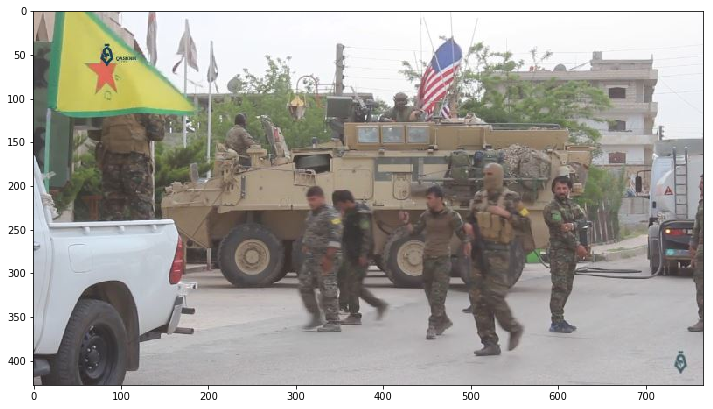

In [6]:
# A few sample images from both folders
# This is one that does not contain an M1 Abrams tank
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/train/not_abrams/YPG_and_US_army_Hassaka_1_5_2017.jpg')

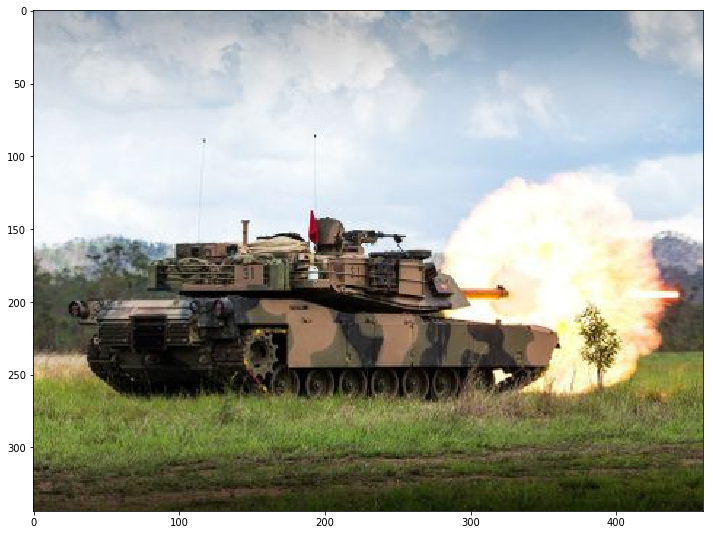

In [7]:
# An image with an M1 Abrams
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/train/abrams/9_4033795_twb171117corey2_fct923x692x19_t460.jpg')

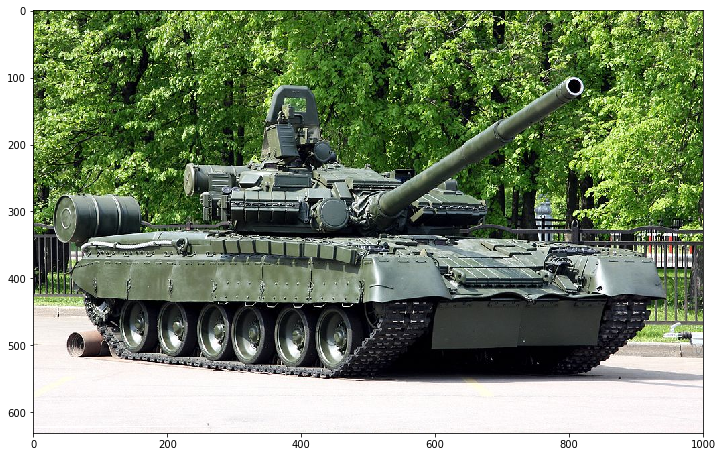

In [8]:
# A tank, but not an M1 Abrams
# Will help the model focus on the features of the M1 that make it distinct from other tanks
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/train/not_abrams/1000px_Russian_T_80BV.jpg')

### ImageDataGenerator

I've downloaded images of M1 Abrams tanks into two folders labeled "abrams" for training and testing and done the same for "not_abrams." I've done this in order to make use of Keras' ImageDataGenerator and .flow_from_directory() to handle my image files as well as label from the folder names. ImageDataGenerator also has some image distortion to add noise to images as it flows them in. I will make use of this to better learn my model.

In [9]:
from keras.preprocessing.image import ImageDataGenerator

Using TensorFlow backend.


In [0]:
# Set the parameters for adding "noise" to the images
image_gen = ImageDataGenerator(rotation_range=20, # slight rotation
                               width_shift_range=0.1, # randomly resizing images
                               height_shift_range=0.1,
                               rescale=1/255, 
                               shear_range=0.2, # crops out parts of the image
                               zoom_range=0.2,
                               horizontal_flip=True, # flip images along the horizontal axis
                               fill_mode='nearest'
                               )

In [11]:
# Now generate many images from the directory
image_gen.flow_from_directory('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/train')

Found 1489 images belonging to 2 classes.


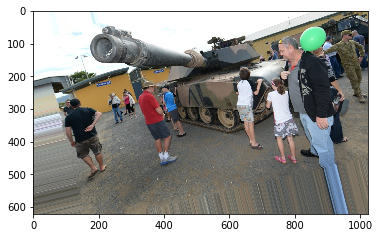

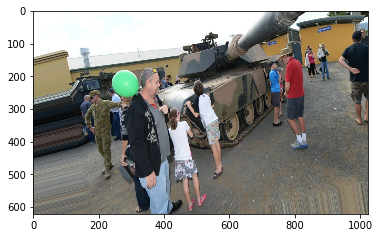

In [12]:
# Inspect how our data generator parameters are transforming our images
abrams = cv2.imread('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/train/abrams/9_2863556_rok050715ctalisman7_t1024.jpg')
abrams = cv2.cvtColor(abrams, cv2.COLOR_BGR2RGB)

plt.imshow(image_gen.random_transform(abrams))
plt.grid(False)
plt.show()

abrams = cv2.imread('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/train/abrams/9_2863556_rok050715ctalisman7_t1024.jpg')
abrams = cv2.cvtColor(abrams, cv2.COLOR_BGR2RGB)

plt.imshow(image_gen.random_transform(abrams))
plt.grid(False)
plt.show()

### CNN

In [13]:
# %cd /content/
!ls

gdrive	sample_data


In [14]:
# Set batch size
batch_size = 32
input_shape = (150,150,3)

# Assign train_image_gen to input into .fit_generator
train_image_gen = image_gen.flow_from_directory('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/train',
                                                   target_size=input_shape[:2],
                                                   batch_size=batch_size,
                                                   class_mode='binary')

# test_image_gen will give us validation accuracy and loss on each epoch to see if the model is actually learning 
# or just overfitting on the training data
test_image_gen = image_gen.flow_from_directory('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test',
                                                   target_size=input_shape[:2],
                                                   batch_size=batch_size,
                                                   class_mode='binary')

Found 1489 images belonging to 2 classes.
Found 470 images belonging to 2 classes.


In [0]:
# Build the Convolutional Neural Network
from keras.models import Sequential
from keras.layers import Activation,Dense,Dropout,Flatten,Conv2D,MaxPooling2D
from tensorflow.keras.callbacks import TensorBoard

##### Model

In [34]:
%tensorboard --logdir ./gdrive/My\ Drive/Colab\ Notebooks/final_project/logs/

Reusing TensorBoard on port 6007 (pid 1838), started 0:43:42 ago. (Use '!kill 1838' to kill it.)

In [0]:
def create_model():
  return tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), input_shape=input_shape, activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, activation='sigmoid')
  ])

In [33]:
def train_model():
  
  model = create_model()
  model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
  
  logdir = os.path.join("./gdrive/My Drive/Colab Notebooks/final_project/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
  es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', verbose=1, mode='min', patience=20)
  mc = tf.keras.callbacks.ModelCheckpoint("./gdrive/My Drive/Colab Notebooks/final_project/trained_models/best_model_20190422.h5",
                                          monitor='val_loss', 
                                          mode='min',
                                          save_best_only=True)
  
  model.fit_generator(train_image_gen,
                      epochs=500,
                      steps_per_epoch=32,
                      validation_data=test_image_gen,
                      callbacks=[tensorboard_callback, es, mc])
  
train_model()

Epoch 1/500
31/32 [============================>.] - ETA: 0s - loss: 0.5650 - accuracy: 0.7702

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 26s 823ms/step - loss: 0.5714 - accuracy: 0.7695 - val_loss: 0.5021 - val_accuracy: 0.8277
Epoch 2/500
31/32 [============================>.] - ETA: 0s - loss: 0.5207 - accuracy: 0.8065

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 642ms/step - loss: 0.5127 - accuracy: 0.8068 - val_loss: 0.5741 - val_accuracy: 0.8277
Epoch 3/500
31/32 [============================>.] - ETA: 0s - loss: 0.5370 - accuracy: 0.7581

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 684ms/step - loss: 0.5325 - accuracy: 0.7598 - val_loss: 0.4943 - val_accuracy: 0.8277
Epoch 4/500
31/32 [============================>.] - ETA: 0s - loss: 0.4974 - accuracy: 0.7661

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 649ms/step - loss: 0.4950 - accuracy: 0.7695 - val_loss: 0.3997 - val_accuracy: 0.8277
Epoch 5/500
31/32 [============================>.] - ETA: 0s - loss: 0.5408 - accuracy: 0.7672

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 722ms/step - loss: 0.5485 - accuracy: 0.7606 - val_loss: 0.4828 - val_accuracy: 0.8277
Epoch 6/500
31/32 [============================>.] - ETA: 0s - loss: 0.4378 - accuracy: 0.8085

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 678ms/step - loss: 0.4392 - accuracy: 0.8047 - val_loss: 0.3856 - val_accuracy: 0.8277
Epoch 7/500
31/32 [============================>.] - ETA: 0s - loss: 0.4762 - accuracy: 0.7581

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 671ms/step - loss: 0.4773 - accuracy: 0.7598 - val_loss: 0.5283 - val_accuracy: 0.8277
Epoch 8/500
31/32 [============================>.] - ETA: 0s - loss: 0.4828 - accuracy: 0.7621

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 701ms/step - loss: 0.4804 - accuracy: 0.7656 - val_loss: 0.4201 - val_accuracy: 0.8277
Epoch 9/500
31/32 [============================>.] - ETA: 0s - loss: 0.3934 - accuracy: 0.8046

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 682ms/step - loss: 0.3949 - accuracy: 0.8048 - val_loss: 0.4138 - val_accuracy: 0.8277
Epoch 10/500
31/32 [============================>.] - ETA: 0s - loss: 0.4427 - accuracy: 0.7923

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 678ms/step - loss: 0.4382 - accuracy: 0.7930 - val_loss: 0.3727 - val_accuracy: 0.8277
Epoch 11/500
31/32 [============================>.] - ETA: 0s - loss: 0.4401 - accuracy: 0.7722

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 677ms/step - loss: 0.4399 - accuracy: 0.7695 - val_loss: 0.4024 - val_accuracy: 0.8277
Epoch 12/500
31/32 [============================>.] - ETA: 0s - loss: 0.5199 - accuracy: 0.7672

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 676ms/step - loss: 0.5212 - accuracy: 0.7606 - val_loss: 0.4723 - val_accuracy: 0.8277
Epoch 13/500
31/32 [============================>.] - ETA: 0s - loss: 0.4184 - accuracy: 0.7883

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 683ms/step - loss: 0.4242 - accuracy: 0.7891 - val_loss: 0.3615 - val_accuracy: 0.8404
Epoch 14/500
31/32 [============================>.] - ETA: 0s - loss: 0.4392 - accuracy: 0.7883

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 668ms/step - loss: 0.4379 - accuracy: 0.7891 - val_loss: 0.4174 - val_accuracy: 0.8255
Epoch 15/500
31/32 [============================>.] - ETA: 0s - loss: 0.4767 - accuracy: 0.7734

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 656ms/step - loss: 0.4754 - accuracy: 0.7726 - val_loss: 0.3639 - val_accuracy: 0.8298
Epoch 16/500
31/32 [============================>.] - ETA: 0s - loss: 0.4440 - accuracy: 0.7964

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 725ms/step - loss: 0.4506 - accuracy: 0.7969 - val_loss: 0.3577 - val_accuracy: 0.8319
Epoch 17/500
31/32 [============================>.] - ETA: 0s - loss: 0.4798 - accuracy: 0.7560

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 664ms/step - loss: 0.4818 - accuracy: 0.7520 - val_loss: 0.4782 - val_accuracy: 0.8404
Epoch 18/500
31/32 [============================>.] - ETA: 0s - loss: 0.4378 - accuracy: 0.7900

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 640ms/step - loss: 0.4360 - accuracy: 0.7928 - val_loss: 0.3926 - val_accuracy: 0.8298
Epoch 19/500
31/32 [============================>.] - ETA: 0s - loss: 0.3964 - accuracy: 0.8044

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 649ms/step - loss: 0.4007 - accuracy: 0.8047 - val_loss: 0.4077 - val_accuracy: 0.8362
Epoch 20/500
31/32 [============================>.] - ETA: 0s - loss: 0.4429 - accuracy: 0.7838

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 723ms/step - loss: 0.4434 - accuracy: 0.7867 - val_loss: 0.3876 - val_accuracy: 0.8468
Epoch 21/500
31/32 [============================>.] - ETA: 0s - loss: 0.4522 - accuracy: 0.7964

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 669ms/step - loss: 0.4488 - accuracy: 0.7969 - val_loss: 0.3604 - val_accuracy: 0.8574
Epoch 22/500
31/32 [============================>.] - ETA: 0s - loss: 0.4164 - accuracy: 0.8206

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 680ms/step - loss: 0.4094 - accuracy: 0.8242 - val_loss: 0.3746 - val_accuracy: 0.8574
Epoch 23/500
31/32 [============================>.] - ETA: 0s - loss: 0.5035 - accuracy: 0.7484

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 24s 742ms/step - loss: 0.5038 - accuracy: 0.7485 - val_loss: 0.4061 - val_accuracy: 0.8340
Epoch 24/500
31/32 [============================>.] - ETA: 0s - loss: 0.4526 - accuracy: 0.7762

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 695ms/step - loss: 0.4539 - accuracy: 0.7793 - val_loss: 0.3945 - val_accuracy: 0.8574
Epoch 25/500
31/32 [============================>.] - ETA: 0s - loss: 0.4437 - accuracy: 0.7923

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 675ms/step - loss: 0.4453 - accuracy: 0.7910 - val_loss: 0.4137 - val_accuracy: 0.8617
Epoch 26/500
31/32 [============================>.] - ETA: 0s - loss: 0.4432 - accuracy: 0.7863

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 659ms/step - loss: 0.4453 - accuracy: 0.7832 - val_loss: 0.3697 - val_accuracy: 0.8298
Epoch 27/500
31/32 [============================>.] - ETA: 0s - loss: 0.4445 - accuracy: 0.8004

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 713ms/step - loss: 0.4489 - accuracy: 0.7988 - val_loss: 0.4623 - val_accuracy: 0.8362
Epoch 28/500
31/32 [============================>.] - ETA: 0s - loss: 0.4463 - accuracy: 0.8085

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 671ms/step - loss: 0.4421 - accuracy: 0.8086 - val_loss: 0.3555 - val_accuracy: 0.8277
Epoch 29/500
31/32 [============================>.] - ETA: 0s - loss: 0.4505 - accuracy: 0.7702

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 657ms/step - loss: 0.4518 - accuracy: 0.7715 - val_loss: 0.3653 - val_accuracy: 0.8404
Epoch 30/500
31/32 [============================>.] - ETA: 0s - loss: 0.4229 - accuracy: 0.7713

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 687ms/step - loss: 0.4247 - accuracy: 0.7726 - val_loss: 0.3435 - val_accuracy: 0.8532
Epoch 31/500
31/32 [============================>.] - ETA: 0s - loss: 0.4387 - accuracy: 0.7921

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 695ms/step - loss: 0.4381 - accuracy: 0.7948 - val_loss: 0.4095 - val_accuracy: 0.8340
Epoch 32/500
31/32 [============================>.] - ETA: 0s - loss: 0.4266 - accuracy: 0.8044

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 641ms/step - loss: 0.4337 - accuracy: 0.8008 - val_loss: 0.3545 - val_accuracy: 0.8532
Epoch 33/500
31/32 [============================>.] - ETA: 0s - loss: 0.4347 - accuracy: 0.8067

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 662ms/step - loss: 0.4328 - accuracy: 0.8089 - val_loss: 0.4104 - val_accuracy: 0.8255


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


Epoch 34/500
31/32 [============================>.] - ETA: 0s - loss: 0.4388 - accuracy: 0.7802

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 707ms/step - loss: 0.4373 - accuracy: 0.7832 - val_loss: 0.3345 - val_accuracy: 0.8319
Epoch 35/500
31/32 [============================>.] - ETA: 0s - loss: 0.4013 - accuracy: 0.8165

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 657ms/step - loss: 0.4056 - accuracy: 0.8125 - val_loss: 0.3512 - val_accuracy: 0.8574
Epoch 36/500
31/32 [============================>.] - ETA: 0s - loss: 0.3503 - accuracy: 0.8488

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 675ms/step - loss: 0.3558 - accuracy: 0.8457 - val_loss: 0.3368 - val_accuracy: 0.8383
Epoch 37/500
31/32 [============================>.] - ETA: 0s - loss: 0.4720 - accuracy: 0.7838

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 708ms/step - loss: 0.4721 - accuracy: 0.7847 - val_loss: 0.3527 - val_accuracy: 0.8660
Epoch 38/500
31/32 [============================>.] - ETA: 0s - loss: 0.4471 - accuracy: 0.7722

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 679ms/step - loss: 0.4484 - accuracy: 0.7734 - val_loss: 0.3479 - val_accuracy: 0.8447
Epoch 39/500
31/32 [============================>.] - ETA: 0s - loss: 0.4627 - accuracy: 0.8129

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 720ms/step - loss: 0.4601 - accuracy: 0.8129 - val_loss: 0.3534 - val_accuracy: 0.8638
Epoch 40/500
31/32 [============================>.] - ETA: 0s - loss: 0.4282 - accuracy: 0.8065

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 655ms/step - loss: 0.4251 - accuracy: 0.8066 - val_loss: 0.3880 - val_accuracy: 0.8617
Epoch 41/500
31/32 [============================>.] - ETA: 0s - loss: 0.4117 - accuracy: 0.7984

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 19s 599ms/step - loss: 0.4122 - accuracy: 0.7969 - val_loss: 0.3488 - val_accuracy: 0.8617
Epoch 42/500
31/32 [============================>.] - ETA: 0s - loss: 0.4250 - accuracy: 0.8206

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 24s 759ms/step - loss: 0.4253 - accuracy: 0.8203 - val_loss: 0.3495 - val_accuracy: 0.8660
Epoch 43/500
31/32 [============================>.] - ETA: 0s - loss: 0.4372 - accuracy: 0.8065

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 664ms/step - loss: 0.4467 - accuracy: 0.7988 - val_loss: 0.3566 - val_accuracy: 0.8617
Epoch 44/500
31/32 [============================>.] - ETA: 0s - loss: 0.4161 - accuracy: 0.8170

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 19s 602ms/step - loss: 0.4124 - accuracy: 0.8189 - val_loss: 0.3492 - val_accuracy: 0.8638
Epoch 45/500
31/32 [============================>.] - ETA: 0s - loss: 0.4204 - accuracy: 0.7903

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 733ms/step - loss: 0.4198 - accuracy: 0.7949 - val_loss: 0.3803 - val_accuracy: 0.8383
Epoch 46/500
31/32 [============================>.] - ETA: 0s - loss: 0.3985 - accuracy: 0.8065

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 691ms/step - loss: 0.4037 - accuracy: 0.8047 - val_loss: 0.3204 - val_accuracy: 0.8638
Epoch 47/500
31/32 [============================>.] - ETA: 0s - loss: 0.3946 - accuracy: 0.8358

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 641ms/step - loss: 0.4032 - accuracy: 0.8290 - val_loss: 0.3400 - val_accuracy: 0.8574
Epoch 48/500
30/32 [===========================>..] - ETA: 0s - loss: 0.4030 - accuracy: 0.8188

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 626ms/step - loss: 0.3964 - accuracy: 0.8189 - val_loss: 0.3167 - val_accuracy: 0.8553
Epoch 49/500
31/32 [============================>.] - ETA: 0s - loss: 0.4001 - accuracy: 0.8125

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 687ms/step - loss: 0.4066 - accuracy: 0.8047 - val_loss: 0.3658 - val_accuracy: 0.8340
Epoch 50/500
31/32 [============================>.] - ETA: 0s - loss: 0.4129 - accuracy: 0.8145

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 681ms/step - loss: 0.4201 - accuracy: 0.8086 - val_loss: 0.3540 - val_accuracy: 0.8553
Epoch 51/500
31/32 [============================>.] - ETA: 0s - loss: 0.4117 - accuracy: 0.8185

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 695ms/step - loss: 0.4027 - accuracy: 0.8242 - val_loss: 0.3376 - val_accuracy: 0.8638
Epoch 52/500
31/32 [============================>.] - ETA: 0s - loss: 0.4113 - accuracy: 0.8087

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 19s 609ms/step - loss: 0.4057 - accuracy: 0.8109 - val_loss: 0.3454 - val_accuracy: 0.8511
Epoch 53/500
31/32 [============================>.] - ETA: 0s - loss: 0.4136 - accuracy: 0.8024

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 24s 748ms/step - loss: 0.4124 - accuracy: 0.8027 - val_loss: 0.3349 - val_accuracy: 0.8638
Epoch 54/500
31/32 [============================>.] - ETA: 0s - loss: 0.4215 - accuracy: 0.8185

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 642ms/step - loss: 0.4201 - accuracy: 0.8223 - val_loss: 0.4158 - val_accuracy: 0.8447
Epoch 55/500
31/32 [============================>.] - ETA: 0s - loss: 0.3972 - accuracy: 0.8274

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 620ms/step - loss: 0.4040 - accuracy: 0.8249 - val_loss: 0.4335 - val_accuracy: 0.7979
Epoch 56/500
31/32 [============================>.] - ETA: 0s - loss: 0.4072 - accuracy: 0.8387

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 629ms/step - loss: 0.4049 - accuracy: 0.8418 - val_loss: 0.3596 - val_accuracy: 0.8596
Epoch 57/500
31/32 [============================>.] - ETA: 0s - loss: 0.3986 - accuracy: 0.8044

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 711ms/step - loss: 0.4002 - accuracy: 0.8027 - val_loss: 0.4177 - val_accuracy: 0.8553
Epoch 58/500
31/32 [============================>.] - ETA: 0s - loss: 0.4075 - accuracy: 0.8025

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 640ms/step - loss: 0.4152 - accuracy: 0.8028 - val_loss: 0.3048 - val_accuracy: 0.8745
Epoch 59/500
31/32 [============================>.] - ETA: 0s - loss: 0.4212 - accuracy: 0.8085

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 642ms/step - loss: 0.4149 - accuracy: 0.8125 - val_loss: 0.3312 - val_accuracy: 0.8681
Epoch 60/500
31/32 [============================>.] - ETA: 0s - loss: 0.4369 - accuracy: 0.8129

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 628ms/step - loss: 0.4414 - accuracy: 0.8109 - val_loss: 0.3453 - val_accuracy: 0.8532
Epoch 61/500
31/32 [============================>.] - ETA: 0s - loss: 0.3884 - accuracy: 0.8266

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 702ms/step - loss: 0.3882 - accuracy: 0.8242 - val_loss: 0.3715 - val_accuracy: 0.8340
Epoch 62/500
31/32 [============================>.] - ETA: 0s - loss: 0.4381 - accuracy: 0.8085

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 627ms/step - loss: 0.4327 - accuracy: 0.8105 - val_loss: 0.3419 - val_accuracy: 0.8660
Epoch 63/500
31/32 [============================>.] - ETA: 0s - loss: 0.4298 - accuracy: 0.8105

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 638ms/step - loss: 0.4282 - accuracy: 0.8086 - val_loss: 0.3251 - val_accuracy: 0.8532
Epoch 64/500
30/32 [===========================>..] - ETA: 0s - loss: 0.4145 - accuracy: 0.8271

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 653ms/step - loss: 0.4156 - accuracy: 0.8270 - val_loss: 0.3546 - val_accuracy: 0.8617
Epoch 65/500
31/32 [============================>.] - ETA: 0s - loss: 0.3752 - accuracy: 0.8387

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 697ms/step - loss: 0.3773 - accuracy: 0.8359 - val_loss: 0.3358 - val_accuracy: 0.8809
Epoch 66/500
31/32 [============================>.] - ETA: 0s - loss: 0.3744 - accuracy: 0.8254

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 702ms/step - loss: 0.3909 - accuracy: 0.8189 - val_loss: 0.3075 - val_accuracy: 0.8638
Epoch 67/500
31/32 [============================>.] - ETA: 0s - loss: 0.4186 - accuracy: 0.8206

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 631ms/step - loss: 0.4110 - accuracy: 0.8242 - val_loss: 0.3206 - val_accuracy: 0.8489
Epoch 68/500
31/32 [============================>.] - ETA: 0s - loss: 0.3841 - accuracy: 0.8266

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 23s 731ms/step - loss: 0.3967 - accuracy: 0.8223 - val_loss: 0.3092 - val_accuracy: 0.8766
Epoch 69/500
31/32 [============================>.] - ETA: 0s - loss: 0.4146 - accuracy: 0.8266

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 646ms/step - loss: 0.4172 - accuracy: 0.8242 - val_loss: 0.3218 - val_accuracy: 0.8723
Epoch 70/500
31/32 [============================>.] - ETA: 0s - loss: 0.3921 - accuracy: 0.8347

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 640ms/step - loss: 0.3901 - accuracy: 0.8379 - val_loss: 0.3319 - val_accuracy: 0.8596
Epoch 71/500
31/32 [============================>.] - ETA: 0s - loss: 0.4175 - accuracy: 0.8129

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 655ms/step - loss: 0.4169 - accuracy: 0.8149 - val_loss: 0.3659 - val_accuracy: 0.8532
Epoch 72/500
31/32 [============================>.] - ETA: 0s - loss: 0.3966 - accuracy: 0.8185

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 674ms/step - loss: 0.3891 - accuracy: 0.8189 - val_loss: 0.3574 - val_accuracy: 0.8383
Epoch 73/500
31/32 [============================>.] - ETA: 0s - loss: 0.4049 - accuracy: 0.7903

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 639ms/step - loss: 0.4047 - accuracy: 0.7891 - val_loss: 0.3534 - val_accuracy: 0.8596
Epoch 74/500
31/32 [============================>.] - ETA: 0s - loss: 0.3655 - accuracy: 0.8441

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 640ms/step - loss: 0.3711 - accuracy: 0.8410 - val_loss: 0.3502 - val_accuracy: 0.8340
Epoch 75/500
31/32 [============================>.] - ETA: 0s - loss: 0.4161 - accuracy: 0.8185

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 651ms/step - loss: 0.4183 - accuracy: 0.8184 - val_loss: 0.3112 - val_accuracy: 0.8617
Epoch 76/500
31/32 [============================>.] - ETA: 0s - loss: 0.3880 - accuracy: 0.8246

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 22s 695ms/step - loss: 0.3892 - accuracy: 0.8223 - val_loss: 0.3210 - val_accuracy: 0.8681
Epoch 77/500
31/32 [============================>.] - ETA: 0s - loss: 0.4103 - accuracy: 0.7944

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 21s 643ms/step - loss: 0.4065 - accuracy: 0.8008 - val_loss: 0.3581 - val_accuracy: 0.8574
Epoch 78/500
31/32 [============================>.] - ETA: 0s - loss: 0.3740 - accuracy: 0.8347

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


32/32 [==============================] - 20s 630ms/step - loss: 0.3766 - accuracy: 0.8340 - val_loss: 0.3125 - val_accuracy: 0.8596
Epoch 00078: early stopping


In [35]:
from tensorboard import notebook
notebook.list() # View open TensorBoard instances

Known TensorBoard instances:
  - port 6006: logdir ./gdrive/My Drive/Colab Notebooks/final_project/logs (started 1:30:26 ago; pid 534)
  - port 6007: logdir ./gdrive/My Drive/Colab Notebooks/final_project/logs/ (started 0:44:44 ago; pid 1838)


In [36]:
# Get the baseline class imbalance
# Necessary to check this way rather than counting from the folders since ImageDataGenerator may have been unable
# to use some of the images
print(len(train_image_gen.filenames))

abrams_count = 0
not_abrams_count = 0
for file in train_image_gen.filenames:
  if file.split('/')[0] == 'abrams':
    abrams_count += 1
  else:
    not_abrams_count += 1

# Print the counts of each class
print(abrams_count, not_abrams_count)


1489
1158 331


Considering the class imbalance for the training data is 331 images of not M1 Abrams and 1158 images of M1 Abrams tanks, the baseline performance for a model that guesses all "M1 Abrams" is .7777. On the final epoch, the model's accuracy was .9207, meaning it was definitely learning.

#### Testing Performance

Now I will check whether the model merely overfit to the training data or actually can detect M1 Abrams tanks by evaluating performance on the testing data.

In [0]:
!pwd

/content/gdrive/My Drive/Colab Notebooks/final_project


In [0]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np

# Load the saved model
loaded_model = load_model('/content/gdrive/My Drive/Colab Notebooks/final_project/trained_models/best_model_20190422.h5')

In [38]:
# Use .evaluate_generator() and test_image_gen to determine how the model performs on the testing data
filenames = test_image_gen.filenames
# Have to set steps to the number of files in the test folder
nb_samples = len(filenames)
loaded_model.evaluate_generator(test_image_gen,verbose=1,steps=nb_samples)

  1/470 [..............................] - ETA: 3:24 - loss: 0.2573 - accuracy: 0.8750

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


 16/470 [>.............................] - ETA: 1:58 - loss: 0.2767 - accuracy: 0.8750

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


 37/470 [=>............................] - ETA: 1:59 - loss: 0.2980 - accuracy: 0.8660

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


 41/470 [=>............................] - ETA: 1:59 - loss: 0.2961 - accuracy: 0.8653

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


 64/470 [===>..........................] - ETA: 1:57 - loss: 0.3065 - accuracy: 0.8606

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


 70/470 [===>..........................] - ETA: 1:55 - loss: 0.3086 - accuracy: 0.8627

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


109/470 [=====>........................] - ETA: 1:41 - loss: 0.3079 - accuracy: 0.8571

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


127/470 [=======>......................] - ETA: 1:35 - loss: 0.3030 - accuracy: 0.8599

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


137/470 [=======>......................] - ETA: 1:32 - loss: 0.3043 - accuracy: 0.8601

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


155/470 [========>.....................] - ETA: 1:27 - loss: 0.3109 - accuracy: 0.8584

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


178/470 [==========>...................] - ETA: 1:20 - loss: 0.3105 - accuracy: 0.8574

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


185/470 [==========>...................] - ETA: 1:18 - loss: 0.3103 - accuracy: 0.8583

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


196/470 [===========>..................] - ETA: 1:15 - loss: 0.3098 - accuracy: 0.8586

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


217/470 [============>.................] - ETA: 1:09 - loss: 0.3124 - accuracy: 0.8586

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


234/470 [=============>................] - ETA: 1:04 - loss: 0.3110 - accuracy: 0.8598

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


241/470 [==============>...............] - ETA: 1:02 - loss: 0.3088 - accuracy: 0.8607

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


256/470 [===============>..............] - ETA: 58s - loss: 0.3091 - accuracy: 0.8608

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


281/470 [================>.............] - ETA: 51s - loss: 0.3096 - accuracy: 0.8616

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


295/470 [=================>............] - ETA: 47s - loss: 0.3091 - accuracy: 0.8618

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


306/470 [==================>...........] - ETA: 44s - loss: 0.3092 - accuracy: 0.8618

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


318/470 [===================>..........] - ETA: 41s - loss: 0.3090 - accuracy: 0.8627

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


334/470 [====================>.........] - ETA: 36s - loss: 0.3082 - accuracy: 0.8615

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


344/470 [====================>.........] - ETA: 34s - loss: 0.3084 - accuracy: 0.8610

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


362/470 [======================>.......] - ETA: 29s - loss: 0.3079 - accuracy: 0.8611

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


385/470 [=======================>......] - ETA: 23s - loss: 0.3073 - accuracy: 0.8619

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


406/470 [========================>.....] - ETA: 17s - loss: 0.3075 - accuracy: 0.8619

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


409/470 [=========================>....] - ETA: 16s - loss: 0.3071 - accuracy: 0.8626

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


431/470 [==========================>...] - ETA: 10s - loss: 0.3081 - accuracy: 0.8623

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


456/470 [============================>.] - ETA: 3s - loss: 0.3073 - accuracy: 0.8622

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


462/470 [============================>.] - ETA: 2s - loss: 0.3080 - accuracy: 0.8615

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


470/470 [==============================] - 129s 274ms/step - loss: 0.3082 - accuracy: 0.8617


[0.3081525947423057, 0.8617368]

Given the class imbalance, baseline performance on the testing data is 0.8277. As we can see, the model beats this by ~4%, meaning it has indeed learned to detect an M1 Abrams to some extent.

Next, to get some topline statistics, I will need to manually get y_true and y_pred because of ImageDataGenerator

In [43]:
# First, get y_pred

y_pred = []
for file in test_image_gen.filenames:
  # NN will expect images in 150x150 so have to resize
  abrams_img = image.load_img('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/' + file,target_size=(150,150))
  abrams_img = image.img_to_array(abrams_img) # convert to array
  abrams_img = np.expand_dims(abrams_img, axis=0) # expand dimensions to fit NN
  
  abrams_img = abrams_img/255 # scale it for the model
  prediction = loaded_model.predict_classes(abrams_img)

  y_pred.append(prediction[0][0])
  

print(y_pred)
# Confirm it's the right length
print(len(y_pred))

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [44]:
# Next, get y_true

abrams_count = 0
not_abrams_count = 0
for file in filenames:
  if file.split('/')[0] == 'abrams':
    abrams_count += 1
  else:
    not_abrams_count += 1

# Print the counts of each class so we know how to fill our y_true array
print(abrams_count, not_abrams_count)

y_true = np.array([0] * 389 + [1] * 81)
y_true

389 81


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [0]:
# Get statistics with sklearn's various functions
from sklearn.metrics import confusion_matrix, classification_report, f1_score, recall_score, precision_score, accuracy_score

In [46]:
print(confusion_matrix(y_true,y_pred))
print('Accuracy:')
print(accuracy_score(y_true,y_pred),'\n')
# Will use f1 score as there's a fair amount of class imbalance
print('F1 Score:')
print(f1_score(y_true,y_pred))

[[356  33]
 [ 27  54]]
Accuracy:
0.8723404255319149 

F1 Score:
0.6428571428571429


The model has more Type I errors or false positives than it does Type II errors (false negatives). Because of the class assignments from ImageDataGenerator, this means that my model is predicting 38 images with an M1 Abrams in them are "not Abrams" and 27 images without an M1 Abrams in them are "Abrams." Ideally, I would prefer my model do the opposite, as I would rather it miss fewer actual M1 Abrams at the expense of falsely assigning "Abrams" to images that are not. This is something to address in my next steps.

Now I want to visually inspect how it performs on a sampling of images.

In [0]:
# Make a function to predict specific images and provide confidence of the prediction

def abrams_predict(image_filepath, model):
  abrams_img = image.load_img(image_filepath,target_size=(150,150))
  abrams_img = image.img_to_array(abrams_img)
  
  # Need to change dimensions so it's a batch of 1 image
  abrams_img = np.expand_dims(abrams_img, axis=0)
  # Re-scale the pixel values
  abrams_img = abrams_img/255
  print('Class prediction:')
  print(model.predict_classes(abrams_img))
  print('Prediction %:')
  print(model.predict(abrams_img))

In [48]:
# Here's how ImageDataGenerator has read in and assigned the classes
print(test_image_gen.class_indices)

{'abrams': 0, 'not_abrams': 1}


Class prediction:
[[1]]
Prediction %:
[[0.7309131]]


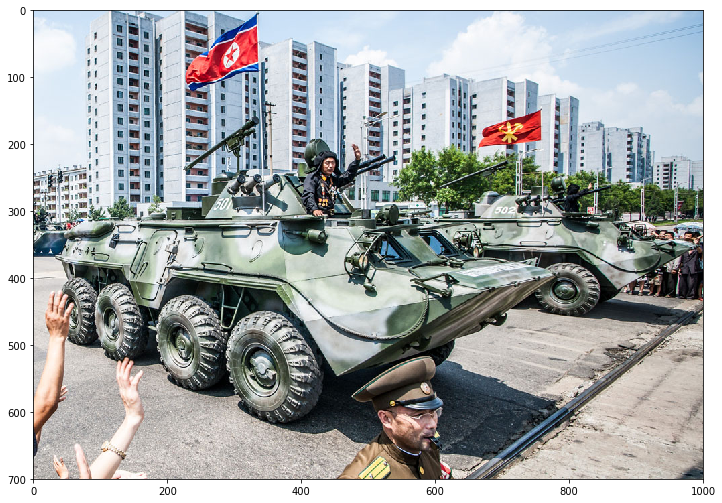

In [49]:
abrams_predict('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/not_abrams/8wh_m2010b.jpg',loaded_model)
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/not_abrams/8wh_m2010b.jpg')

Correctly predicted these APCs as "not Abrams" and did so with 92% confidence.

Class prediction:
[[1]]
Prediction %:
[[0.6491118]]


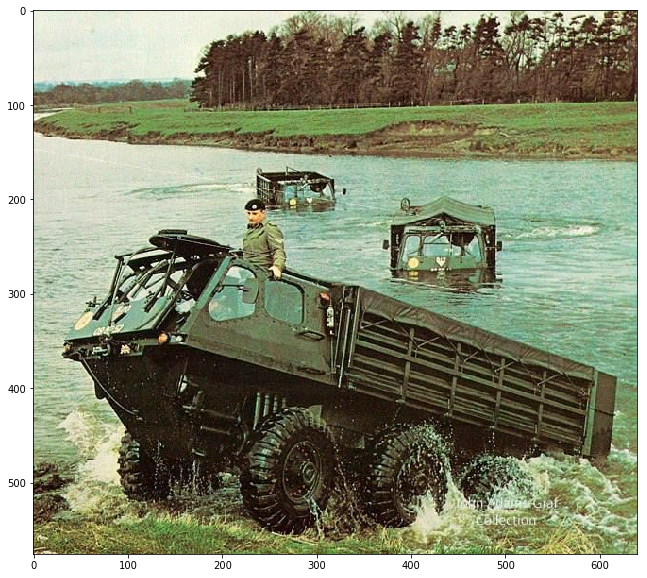

In [50]:
abrams_predict('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/not_abrams/007b904c4e78daaebdd4568278060e89__british_tanks_british_army.jpg',loaded_model)
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/not_abrams/007b904c4e78daaebdd4568278060e89__british_tanks_british_army.jpg')

The model was even more confident these trucks were not M1 Abrams tanks.

Class prediction:
[[0]]
Prediction %:
[[0.0048896]]


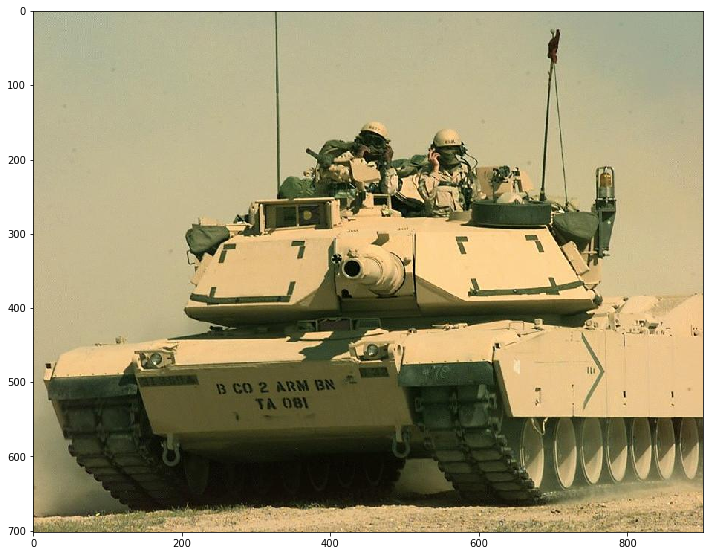

In [51]:
abrams_predict('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/abrams/m1a1_tankinmo 2.jpg',loaded_model)
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/abrams/m1a1_tankinmo 2.jpg')

For this image of an M1 Abrams, the model was extremely confident (>99.99999%) that this was an image of an M1 Abrams tank.

Class prediction:
[[0]]
Prediction %:
[[0.0343012]]


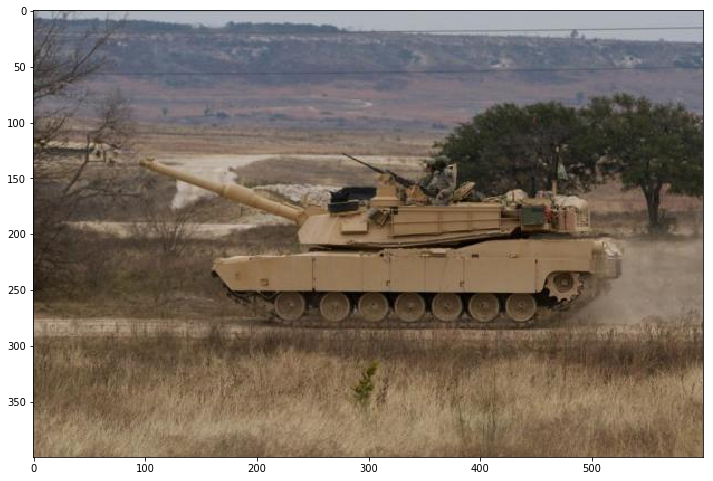

In [52]:
abrams_predict('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/abrams/US_Army_selects_General_Dynamics_for_Abrams_tank_production (1).jpg',loaded_model)
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/abrams/US_Army_selects_General_Dynamics_for_Abrams_tank_production (1).jpg')

It was also very confident this was an M1 Abrams tank, despite it being from the side. It is possible the model has picked up on the number of wheels or the distinct shape of the turret.

Class prediction:
[[1]]
Prediction %:
[[0.574882]]


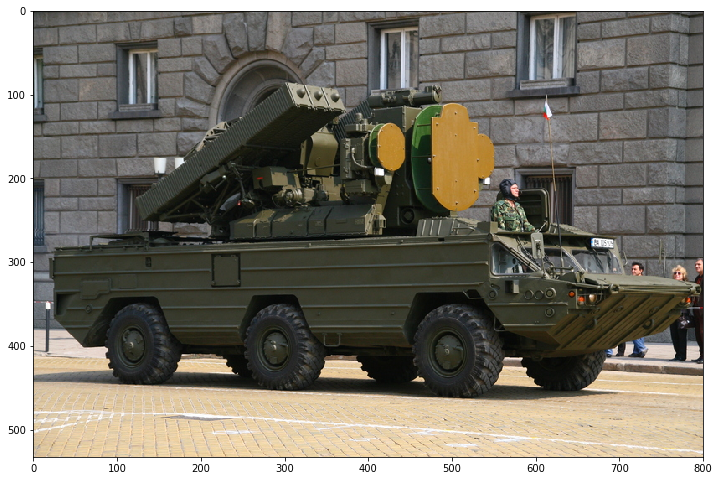

In [53]:
abrams_predict('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/not_abrams/Bulgarian_SA_8.jpg',loaded_model)
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/test/not_abrams/Bulgarian_SA_8.jpg')

The model got this one correct, but only barely.

The real images I care about are those from a few social media accounts of Iraq militia groups. This first one is from the video I mentioned as the genesis for this project. The group was showing off its equipment in a military parade and quickly panned over this M1 Abrams on the back of one of their trucks.

Class prediction:
[[0]]
Prediction %:
[[0.17747892]]


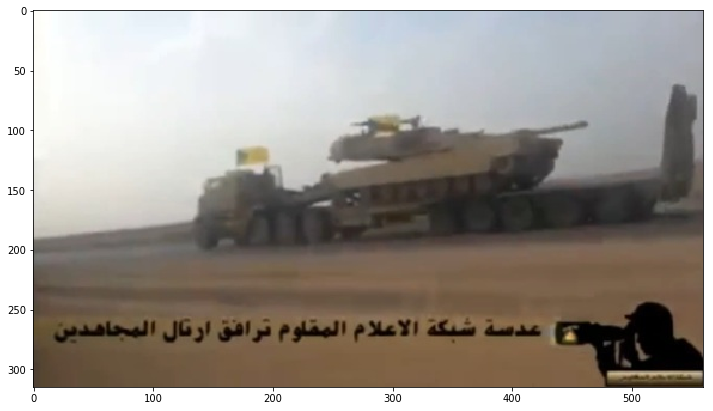

In [54]:
abrams_predict('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/KH_abrams_1.jpg',loaded_model)
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/KH_abrams_1.jpg')

A second image from a different militia group.

Class prediction:
[[0]]
Prediction %:
[[0.13393264]]


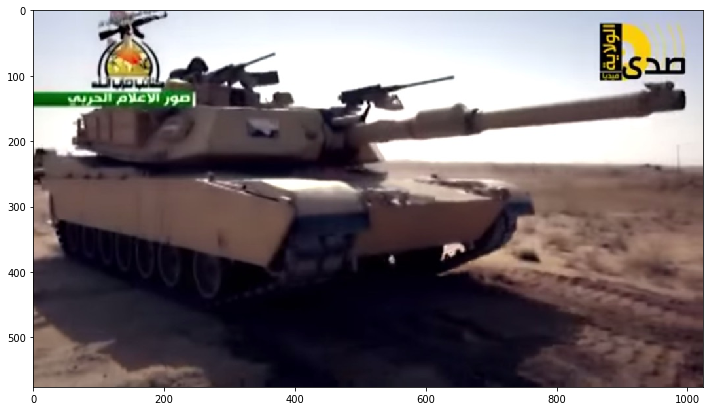

In [55]:
abrams_predict('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/KH_abrams_2_jpg.jpg',loaded_model)
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/KH_abrams_2_jpg.jpg')

Class prediction:
[[0]]
Prediction %:
[[0.14195566]]


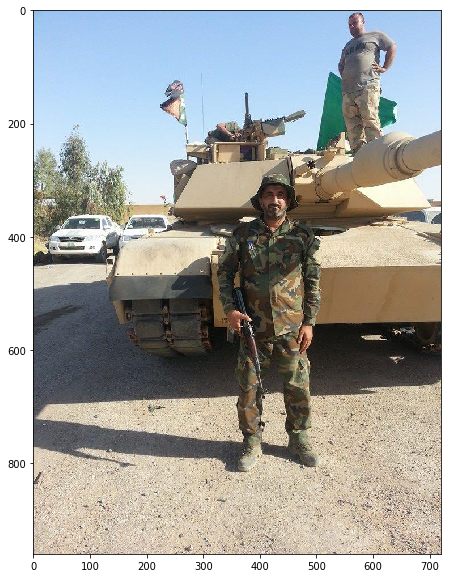

In [56]:
abrams_predict('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/badr_abrams_1.jpg',loaded_model)
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/badr_abrams_1.jpg')

Here the tank is partially occluded by the man, but the model is still able to correctly predict the M1 Abrams with a high degree of confidence.

Class prediction:
[[0]]
Prediction %:
[[0.35853583]]


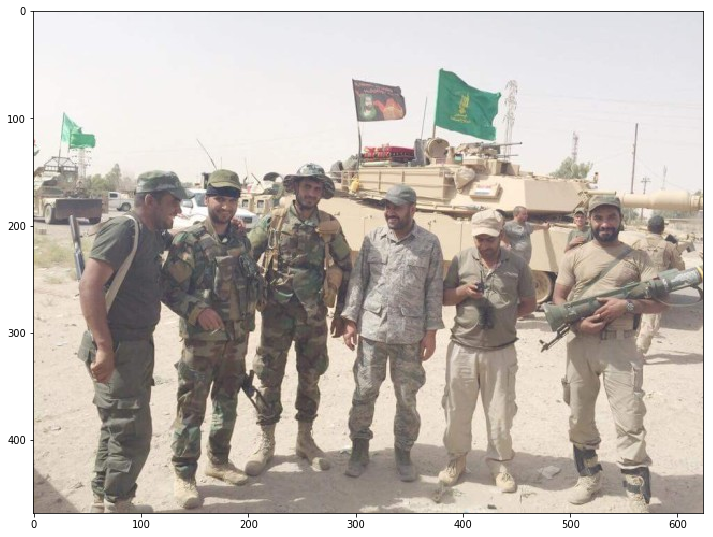

In [57]:
abrams_predict('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/badr_abrams_2.jpg',loaded_model)
display_image('/content/gdrive/My Drive/Colab Notebooks/final_project/abrams_not_abrams/badr_abrams_2.jpg')